In [195]:
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.layers import Conv2D, Activation, MaxPool2D, BatchNormalization, Flatten, Dense, Dropout
import pathlib
import scipy.io
import os, os.path, shutil
import pandas as pd
from PIL import Image
import numpy as np
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

In [208]:
def create_classes_folder(path_):
    images = [f for f in os.listdir(path_) if os.path.isfile(os.path.join(path_, f))]
    for image in images:
        folder_name = df[df.image == image]['class'].values[0]
        new_path = os.path.join(folder_path, folder_name)
        if not os.path.exists(new_path):
            os.makedirs(new_path)

        old_image_path = os.path.join(folder_path, image)
        new_image_path = os.path.join(new_path, image)
        shutil.move(old_image_path, new_image_path)

In [203]:
def make_model(input_shape, num_classes, model_type_, aug_version_):
    inputs = keras.Input(shape=input_shape)
    # Image augmentation block
    if aug_version_ == 1:
        x = data_augmentation(inputs)
    elif aug_version_ == 2:
        x = aug(inputs)

    # Entry block
    x = layers.Rescaling(1.0 / 255)(x)
    if model_type_ == 1:
        x = layers.Conv2D(16, 3, padding='same', activation='relu')(x)
        x = layers.MaxPooling2D()(x)
        x = layers.Conv2D(32, 3, padding='same', activation='relu')(x)
        x = layers.MaxPooling2D()(x)
        x = layers.Conv2D(64, 3, padding='same', activation='relu')(x)
        x = layers.MaxPooling2D()(x)
        x = layers.Dropout(0.2)(x)
        x = layers.Flatten()(x)
        x = layers.Dense(128, activation='relu')(x)
    elif model_type_ == 2:
        x = layers.Conv2D(32, 3, strides=2, padding="same")(x)
        x = layers.BatchNormalization()(x)
        x = layers.Activation("relu")(x)

        x = layers.Conv2D(64, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)
        x = layers.Activation("relu")(x)

        previous_block_activation = x  # Set aside residual

        for size in [128, 256, 512, 728]:
            x = layers.Activation("relu")(x)
            x = layers.SeparableConv2D(size, 3, padding="same")(x)
            x = layers.BatchNormalization()(x)

            x = layers.Activation("relu")(x)
            x = layers.SeparableConv2D(size, 3, padding="same")(x)
            x = layers.BatchNormalization()(x)

            x = layers.MaxPooling2D(3, strides=2, padding="same")(x)

            # Project residual
            residual = layers.Conv2D(size, 1, strides=2, padding="same")(
                previous_block_activation
            )
            x = layers.add([x, residual]) 
            previous_block_activation = x 

        x = layers.SeparableConv2D(1024, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)
        x = layers.Activation("relu")(x)

        x = layers.GlobalAveragePooling2D()(x)
        x = layers.Dropout(0.5)(x)
        
    
    activation = "softmax"
    units = num_classes    
    outputs = layers.Dense(units, activation=activation)(x)
    return keras.Model(inputs, outputs)

In [206]:
def plot_metrics(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']

    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs_range = range(epochs)

    plt.figure(figsize=(8, 8))
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, acc, label='Training Accuracy')
    plt.plot(epochs_range, val_acc, label='Validation Accuracy')
    plt.legend(loc='lower right')
    plt.title('Training and Validation Accuracy')

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, loss, label='Training Loss')
    plt.plot(epochs_range, val_loss, label='Validation Loss')
    plt.legend(loc='upper right')
    plt.title('Training and Validation Loss')
    plt.show()

In [209]:
def flatten_list(list_):
    flat_list = []
    for sublist in list_:
        for item in sublist:
            flat_list.append(item)
    return flat_list

def make_confusion_mtrx(model_, val_ds, save_path):
    y_pred = []
    y_true = []
    for x, y in val_ds.take(-1):
        y_pred.append(np.argmax(model_.predict(x), axis = 1))
        y_true.append(y)

    y_pred_fl = flatten_list(y_pred)
    y_true_fl = flatten_list(y_true)
    conf_mx = confusion_matrix(y_pred_fl, y_true_fl)
    df_cm = pd.DataFrame(conf_mx , index = [i for i in range(0,196)],
                  columns = [i for i in range(0,196)])
    cmap = sns.diverging_palette(230, 20, as_cmap=True)
    plt.figure(figsize = (100,100))
    cm_fig = sns.heatmap(df_cm, cmap=cmap, annot=True)
    fig = cm_fig.get_figure()
    fig.savefig(save_path) 
    return cm_fig

In [210]:
def make_a_prediction(model_, img_path):
    img = keras.preprocessing.image.load_img(
    img_path, target_size=(256,256))
    img_array = keras.preprocessing.image.img_to_array(img)
    img_array = tf.expand_dims(img_array, 0)  # Create batch axis

    predictions = model_.predict(img_array)
    score = predictions[0]
    image = Image.open(img_path)
    display(image)
    return (f'The car on the image is most likely - {train_ds.class_names[np.argmax(score)]}')

In [5]:
tf.__version__

'2.6.0'

In [2]:
physical_devices = tf.config.list_physical_devices('GPU')
tf.config.experimental.set_memory_growth(physical_devices[0], True)

for device in physical_devices:
    tf.config.experimental.set_memory_growth(device, True)

In [49]:
# uncomment for downloading data
# data_dir = tf.keras.utils.get_file(
#     "stanford_cars",
#     "http://ai.stanford.edu/~jkrause/car196/car_ims.tgz",
#     untar=True, extract= True)
# data_dir = pathlib.Path(data_dir)

In [5]:
#data_dir = pathlib.Path(data_dir)
data_dir = 'C:/Users/kaara/.keras/datasets/car_ims'
image_count = len(list(data_dir.glob('*/*.jpg')))
mat = scipy.io.loadmat('C:/Users/kaara/.keras/datasets/cars_annos.mat')
print(image_count)

16103


In [7]:
data = []
for i in range (0,mat['annotations'].shape[1]):
    obj = mat['annotations'][0][i]
    im_path = obj[0][0].split('/')[1]
    class_name = mat['class_names'][0][obj[5][0][0]-1][0] 
    data.append([im_path,class_name])
df = pd.DataFrame(data, columns = ['image','class'])    

In [69]:
# Uncomment when new data has been downloaded
# This step is needed because in archive all data store in one folder,
# to use tf.image_dataset_from_directory we need folder for each class

#create_classes_folder('C:/Users/kaara/.keras/datasets/car_ims')

In [70]:
image_size = (256,256)
batch_size = 16

train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    data_dir,
    validation_split=0.2,
    subset="training",
    seed=1337,
    image_size=image_size,
    batch_size=batch_size,
)
val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    data_dir,
    validation_split=0.2,
    subset="validation",
    seed=1337,
    image_size=image_size,
    batch_size=batch_size,
)

Found 16185 files belonging to 196 classes.
Using 12948 files for training.
Found 16185 files belonging to 196 classes.
Using 3237 files for validation.


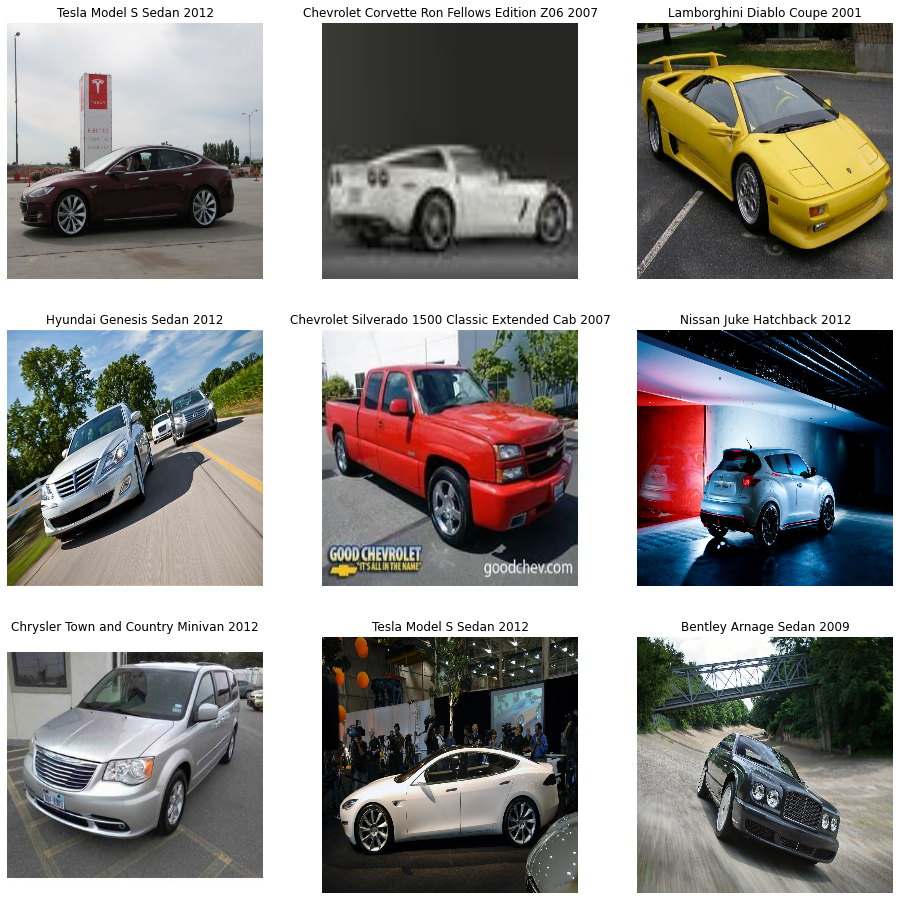

In [196]:


plt.figure(figsize=(16, 16))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(train_ds.class_names[(int(labels[i]))])
        plt.axis("off")

In [198]:
data_augmentation = keras.Sequential(
    [
        layers.RandomFlip("horizontal"),
        layers.RandomRotation(0.1),
    ]
)

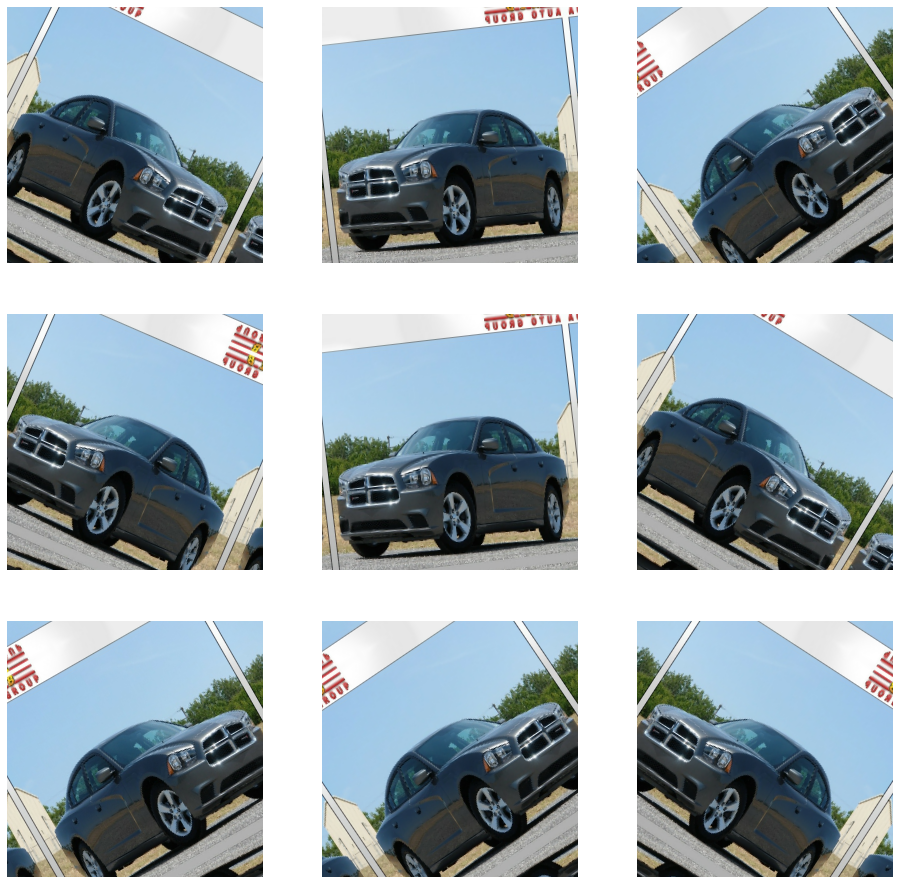

In [199]:
plt.figure(figsize=(16, 16))
for images, _ in train_ds.take(1):
    for i in range(9):
        augmented_images = data_augmentation(images)
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(augmented_images[0].numpy().astype("uint8"))
        plt.axis("off")

In [20]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [204]:
model = make_model(input_shape=image_size + (3,), num_classes=196, model_type_= 1, aug_version_= 1)
model.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 256, 256, 3)]     0         
_________________________________________________________________
sequential_1 (Sequential)    (None, 256, 256, 3)       0         
_________________________________________________________________
rescaling_1 (Rescaling)      (None, 256, 256, 3)       0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 256, 256, 16)      448       
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 128, 128, 16)      0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 128, 128, 32)      4640      
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 64, 64, 32)        0   

In [2]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


In [55]:
epochs = 200


model.compile(
    optimizer=keras.optimizers.Adam(1e-3),
    loss=tf.keras.losses.SparseCategoricalCrossentropy(),
    metrics=["accuracy"],
)
history_smp = model.fit(
    train_ds, epochs=epochs, validation_data=val_ds,
)

Epoch 1/200
810/810 [==============================] - 20s 24ms/step - loss: 5.2816 - accuracy: 0.0056 - val_loss: 5.2740 - val_accuracy: 0.0065
Epoch 2/200
810/810 [==============================] - 19s 23ms/step - loss: 5.1932 - accuracy: 0.0114 - val_loss: 5.1111 - val_accuracy: 0.0130
Epoch 3/200
810/810 [==============================] - 19s 24ms/step - loss: 5.0215 - accuracy: 0.0211 - val_loss: 5.0060 - val_accuracy: 0.0229
Epoch 4/200
810/810 [==============================] - 19s 24ms/step - loss: 4.8835 - accuracy: 0.0331 - val_loss: 4.9494 - val_accuracy: 0.0318
Epoch 5/200
810/810 [==============================] - 19s 24ms/step - loss: 4.7388 - accuracy: 0.0513 - val_loss: 4.9166 - val_accuracy: 0.0389
Epoch 6/200
810/810 [==============================] - 19s 24ms/step - loss: 4.6062 - accuracy: 0.0639 - val_loss: 4.9678 - val_accuracy: 0.0414
Epoch 7/200
810/810 [==============================] - 19s 24ms/step - loss: 4.4665 - accuracy: 0.0818 - val_loss: 4.9050 - val_ac

810/810 [==============================] - 19s 23ms/step - loss: 1.1583 - accuracy: 0.6837 - val_loss: 9.9167 - val_accuracy: 0.0961
Epoch 114/200
810/810 [==============================] - 19s 23ms/step - loss: 1.1249 - accuracy: 0.6994 - val_loss: 10.5491 - val_accuracy: 0.0877
Epoch 115/200
810/810 [==============================] - 19s 23ms/step - loss: 1.1638 - accuracy: 0.6857 - val_loss: 10.1221 - val_accuracy: 0.0945
Epoch 116/200
810/810 [==============================] - 19s 23ms/step - loss: 1.1401 - accuracy: 0.6903 - val_loss: 10.4352 - val_accuracy: 0.0936
Epoch 117/200
810/810 [==============================] - 19s 23ms/step - loss: 1.1329 - accuracy: 0.6929 - val_loss: 10.7374 - val_accuracy: 0.0942
Epoch 118/200
810/810 [==============================] - 19s 23ms/step - loss: 1.1223 - accuracy: 0.6973 - val_loss: 11.1145 - val_accuracy: 0.0843
Epoch 119/200
810/810 [==============================] - 19s 23ms/step - loss: 1.1255 - accuracy: 0.6989 - val_loss: 10.4065 - 

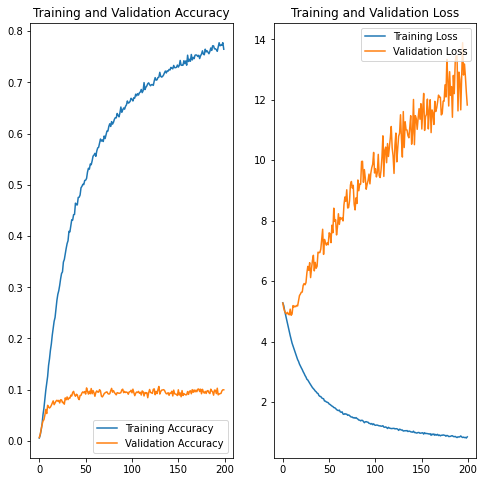

In [56]:
plot_metrics(history_smp)

That was just a simple CNN, which, actualy didn't succed on the validation data. So let's build more complex one.

In [57]:
model_res = make_model(input_shape=image_size + (3,), num_classes=196, model_type_= 2, aug_version_= 1)
model_res.summary()

Model: "model_7"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_13 (InputLayer)           [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
sequential (Sequential)         (None, 256, 256, 3)  0           input_13[0][0]                   
__________________________________________________________________________________________________
rescaling_12 (Rescaling)        (None, 256, 256, 3)  0           sequential[12][0]                
__________________________________________________________________________________________________
conv2d_51 (Conv2D)              (None, 128, 128, 32) 896         rescaling_12[0][0]               
____________________________________________________________________________________________

Initialy, I've ran it on 200 epochs, and it has taken ~10 hours to train. In case, if something goes wrong with cells, results can be found in images, which I've put into the archive. 

Results: loss: 0.0468 - accuracy: 0.9852 - val_loss: 2.0041 - val_accuracy: 0.7322

In [59]:
epochs = 200

model_res.compile(
    optimizer=keras.optimizers.Adam(1e-3),
    loss=tf.keras.losses.SparseCategoricalCrossentropy(),
    metrics=["accuracy"],
)
history = model_res.fit(
    train_ds, epochs=epochs, validation_data=val_ds,
)

Epoch 1/200
810/810 [==============================] - 164s 200ms/step - loss: 5.3708 - accuracy: 0.0073 - val_loss: 5.9953 - val_accuracy: 0.0086
Epoch 2/200
810/810 [==============================] - 162s 200ms/step - loss: 5.2027 - accuracy: 0.0120 - val_loss: 5.2502 - val_accuracy: 0.0142
Epoch 3/200
810/810 [==============================] - 162s 200ms/step - loss: 5.1376 - accuracy: 0.0149 - val_loss: 5.2845 - val_accuracy: 0.0127
Epoch 4/200
810/810 [==============================] - 162s 200ms/step - loss: 5.0854 - accuracy: 0.0204 - val_loss: 5.1808 - val_accuracy: 0.0192
Epoch 5/200
810/810 [==============================] - 162s 200ms/step - loss: 5.0052 - accuracy: 0.0243 - val_loss: 5.3158 - val_accuracy: 0.0114
Epoch 6/200
810/810 [==============================] - 161s 199ms/step - loss: 4.9139 - accuracy: 0.0351 - val_loss: 4.9125 - val_accuracy: 0.0349
Epoch 7/200
810/810 [==============================] - 161s 199ms/step - loss: 4.7676 - accuracy: 0.0431 - val_loss: 4

810/810 [==============================] - 162s 200ms/step - loss: 0.0745 - accuracy: 0.9774 - val_loss: 1.6243 - val_accuracy: 0.7124
Epoch 112/200
810/810 [==============================] - 162s 200ms/step - loss: 0.0809 - accuracy: 0.9741 - val_loss: 2.1645 - val_accuracy: 0.6951
Epoch 113/200
810/810 [==============================] - 163s 201ms/step - loss: 0.0987 - accuracy: 0.9685 - val_loss: 2.1241 - val_accuracy: 0.6540
Epoch 114/200
810/810 [==============================] - 168s 207ms/step - loss: 0.0812 - accuracy: 0.9746 - val_loss: 1.5550 - val_accuracy: 0.7538
Epoch 115/200
810/810 [==============================] - 167s 207ms/step - loss: 0.0700 - accuracy: 0.9780 - val_loss: 1.7560 - val_accuracy: 0.7495
Epoch 116/200
810/810 [==============================] - 171s 211ms/step - loss: 0.0796 - accuracy: 0.9737 - val_loss: 1.7315 - val_accuracy: 0.7285
Epoch 117/200
810/810 [==============================] - 167s 207ms/step - loss: 0.0769 - accuracy: 0.9768 - val_loss: 1

810/810 [==============================] - 166s 205ms/step - loss: 0.0558 - accuracy: 0.9815 - val_loss: 1.6781 - val_accuracy: 0.7266
Epoch 167/200
810/810 [==============================] - 168s 207ms/step - loss: 0.0462 - accuracy: 0.9862 - val_loss: 1.9172 - val_accuracy: 0.7037
Epoch 168/200
810/810 [==============================] - 167s 207ms/step - loss: 0.0598 - accuracy: 0.9809 - val_loss: 2.2108 - val_accuracy: 0.6806
Epoch 169/200
810/810 [==============================] - 167s 207ms/step - loss: 0.0636 - accuracy: 0.9809 - val_loss: 1.7448 - val_accuracy: 0.7297
Epoch 170/200
810/810 [==============================] - 167s 207ms/step - loss: 0.0459 - accuracy: 0.9859 - val_loss: 1.6959 - val_accuracy: 0.7266
Epoch 171/200
810/810 [==============================] - 164s 202ms/step - loss: 0.0512 - accuracy: 0.9849 - val_loss: 2.3144 - val_accuracy: 0.6716
Epoch 172/200
810/810 [==============================] - 163s 201ms/step - loss: 0.0654 - accuracy: 0.9806 - val_loss: 2

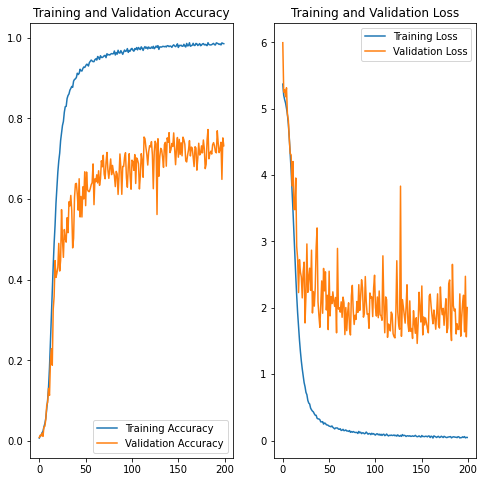

In [60]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

<AxesSubplot:>

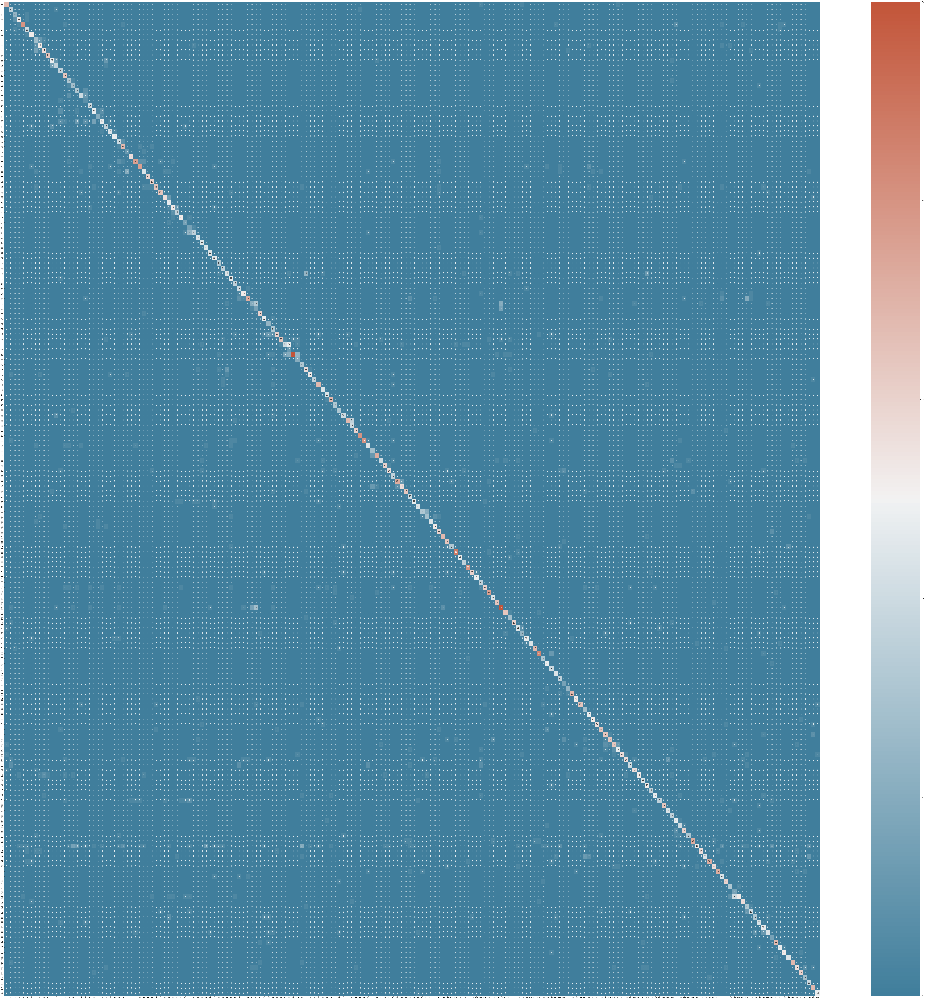

In [81]:
make_confusion_mtrx(model_ = model_res, validation_df = val_ds, save_path = 'confusion_matrix.jpg')

Hint: click on the matrix, it is much bigger, than Jupier can display in the cell

In [82]:
fig = cm_fig.get_figure()
fig.savefig('confusion_matrix.png') 

I've notices that the last 50 epochs hasn't make a great influence on overall accuracy, so I've retraindes the model on 150 epochs and add sligthly more complex data augmentation

In [10]:
aug = keras.Sequential(
    [
        layers.RandomFlip("horizontal"),
        layers.RandomRotation(0.1),
        layers.RandomZoom(0.5,0.3)
    ]
)

In [205]:
model_res_new = make_model(input_shape=image_size + (3,), num_classes=196, model_type_= 2, aug_version_= 2)
model_res_new.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
sequential (Sequential)         (None, 256, 256, 3)  0           input_4[0][0]                    
__________________________________________________________________________________________________
rescaling_2 (Rescaling)         (None, 256, 256, 3)  0           sequential[1][0]                 
__________________________________________________________________________________________________
conv2d_9 (Conv2D)               (None, 128, 128, 32) 896         rescaling_2[0][0]                
____________________________________________________________________________________________

In [13]:
epochs = 150

callbacks = [
    keras.callbacks.ModelCheckpoint("save_at_{epoch}.h5"),
]

model_res_new.compile(
    optimizer=keras.optimizers.Adam(1e-3),
    loss=tf.keras.losses.SparseCategoricalCrossentropy(),
    metrics=["accuracy"],
)
history_new_res = model_res_new.fit(
    train_ds, epochs=epochs,callbacks=callbacks, validation_data=val_ds,
)

Epoch 1/150
810/810 [==============================] - 172s 206ms/step - loss: 5.3752 - accuracy: 0.0103 - val_loss: 5.7326 - val_accuracy: 0.0127
Epoch 2/150


C:\Users\kaara\Anaconda3\envs\cuda11_2\lib\site-packages\keras\utils\generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


810/810 [==============================] - 165s 204ms/step - loss: 5.2063 - accuracy: 0.0124 - val_loss: 5.1795 - val_accuracy: 0.0139
Epoch 3/150
810/810 [==============================] - 166s 205ms/step - loss: 5.1417 - accuracy: 0.0155 - val_loss: 5.5809 - val_accuracy: 0.0093
Epoch 4/150
810/810 [==============================] - 166s 205ms/step - loss: 5.0802 - accuracy: 0.0233 - val_loss: 5.3389 - val_accuracy: 0.0219
Epoch 5/150
810/810 [==============================] - 168s 207ms/step - loss: 5.0254 - accuracy: 0.0259 - val_loss: 5.7912 - val_accuracy: 0.0148
Epoch 6/150
810/810 [==============================] - 166s 205ms/step - loss: 4.9661 - accuracy: 0.0302 - val_loss: 5.0828 - val_accuracy: 0.0247
Epoch 7/150
810/810 [==============================] - 167s 206ms/step - loss: 4.8844 - accuracy: 0.0370 - val_loss: 4.9264 - val_accuracy: 0.0337
Epoch 8/150
810/810 [==============================] - 166s 205ms/step - loss: 4.8054 - accuracy: 0.0452 - val_loss: 4.7718 - val_

810/810 [==============================] - 166s 204ms/step - loss: 0.4726 - accuracy: 0.8541 - val_loss: 1.2412 - val_accuracy: 0.7127
Epoch 58/150
810/810 [==============================] - 165s 204ms/step - loss: 0.4565 - accuracy: 0.8615 - val_loss: 0.8870 - val_accuracy: 0.7723
Epoch 59/150
810/810 [==============================] - 166s 204ms/step - loss: 0.4550 - accuracy: 0.8601 - val_loss: 0.8730 - val_accuracy: 0.7683
Epoch 60/150
810/810 [==============================] - 166s 205ms/step - loss: 0.4391 - accuracy: 0.8635 - val_loss: 1.0439 - val_accuracy: 0.7522
Epoch 61/150
810/810 [==============================] - 165s 204ms/step - loss: 0.4361 - accuracy: 0.8635 - val_loss: 1.0014 - val_accuracy: 0.7569
Epoch 62/150
810/810 [==============================] - 165s 204ms/step - loss: 0.4216 - accuracy: 0.8703 - val_loss: 0.9235 - val_accuracy: 0.7779
Epoch 63/150
810/810 [==============================] - 166s 205ms/step - loss: 0.4155 - accuracy: 0.8723 - val_loss: 0.9988 

810/810 [==============================] - 167s 206ms/step - loss: 0.2140 - accuracy: 0.9333 - val_loss: 1.1388 - val_accuracy: 0.7797
Epoch 113/150
810/810 [==============================] - 167s 206ms/step - loss: 0.2111 - accuracy: 0.9347 - val_loss: 1.0260 - val_accuracy: 0.7853
Epoch 114/150
810/810 [==============================] - 167s 206ms/step - loss: 0.2040 - accuracy: 0.9351 - val_loss: 1.1389 - val_accuracy: 0.7668
Epoch 115/150
810/810 [==============================] - 167s 206ms/step - loss: 0.2073 - accuracy: 0.9345 - val_loss: 1.0002 - val_accuracy: 0.7927
Epoch 116/150
810/810 [==============================] - 167s 206ms/step - loss: 0.1899 - accuracy: 0.9381 - val_loss: 0.9537 - val_accuracy: 0.7905
Epoch 117/150
810/810 [==============================] - 167s 206ms/step - loss: 0.2083 - accuracy: 0.9350 - val_loss: 0.9300 - val_accuracy: 0.8004
Epoch 118/150
810/810 [==============================] - 167s 206ms/step - loss: 0.1950 - accuracy: 0.9369 - val_loss: 1

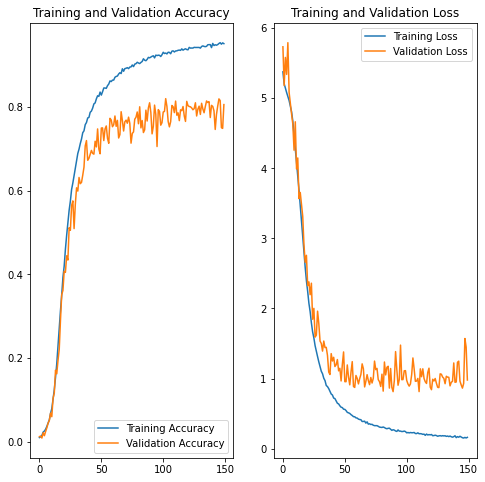

In [207]:
plot_metrics(history_new_res)

And now we can see, that adding just one more step into the data augmentation makes it ~5% more accurate and greatly reduce the validation loss even on lower numbers of epochs (150 vs 200 with less augmentation). And it is really great! It is much easier to preprocess images, than try to optimize the number and order of layers, and more time effective than trying to fit NN more.

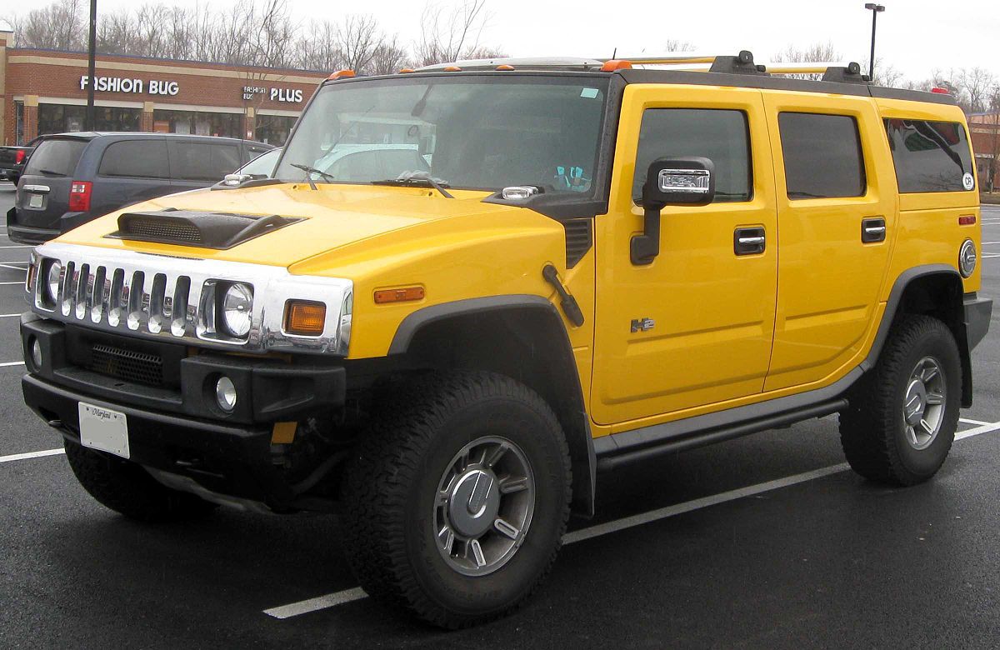

'The car on the image is most likely - HUMMER H2 SUT Crew Cab 2009'

In [39]:
make_a_prediction(model_res_new,"h2.jpg")

Comment: perfect match!

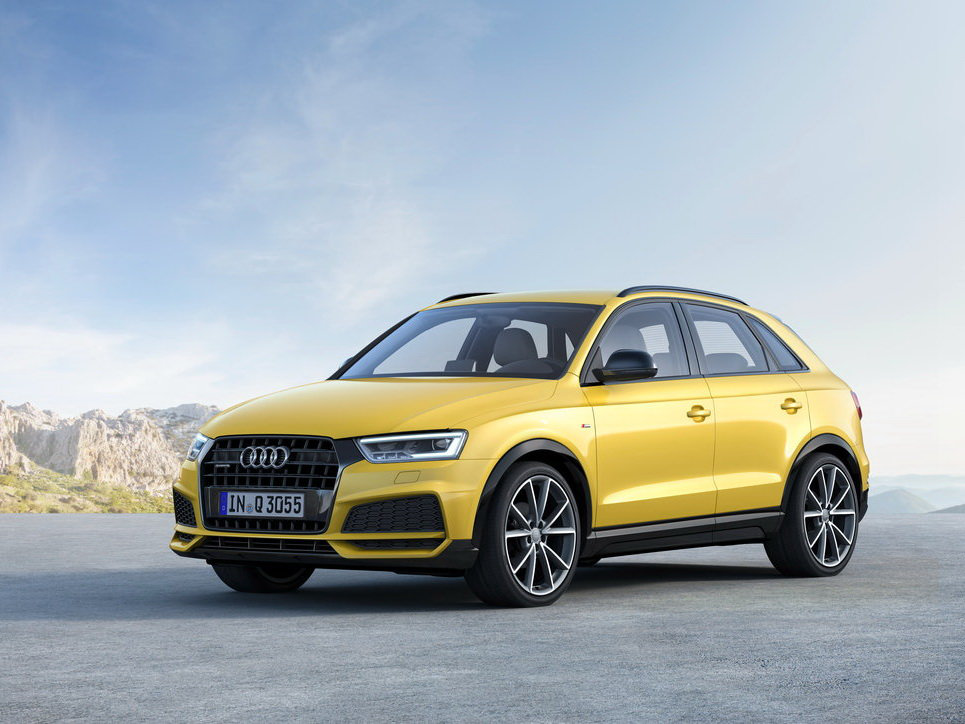

'The car on the image is most likely - Audi R8 Coupe 2012'

In [40]:
make_a_prediction(model_res_new,"audi_q3.jpg")

Comment: So, it understand that it is an Audi, however it is Q3 Sportback while R8 is a sport car. Not very accurate, I supposed there had been some Audi crossovers in the dataset

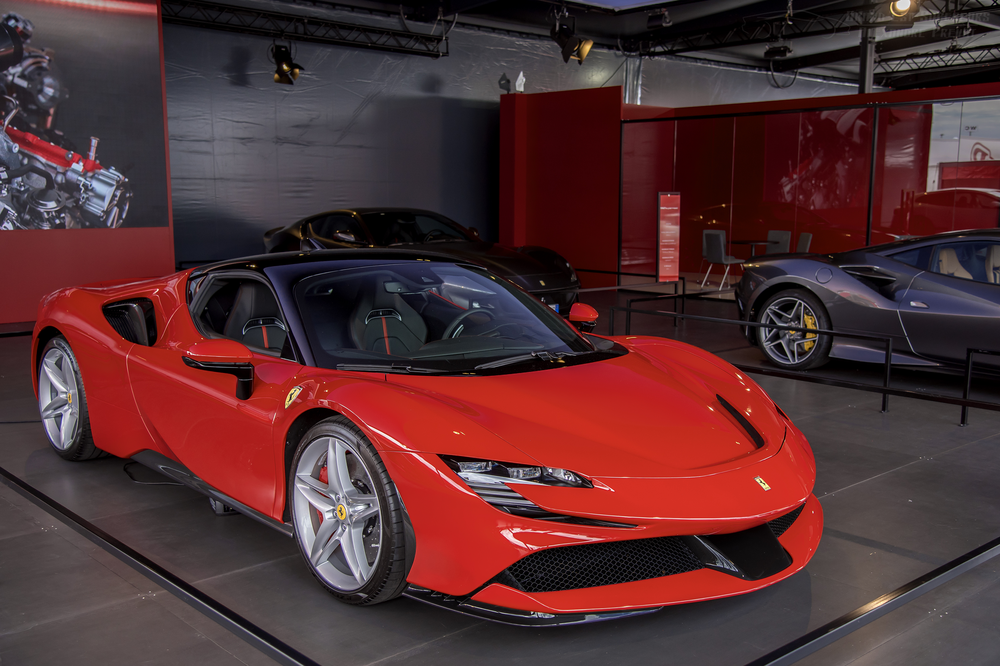

'The car on the image is most likely - Ferrari 458 Italia Convertible 2012'

In [41]:
make_a_prediction(model_res_new,"Ferrari_SF90.jpg")

Comment: So, again, it is not 458 Italia, it is SF90, however, they are really quite similar

<AxesSubplot:>

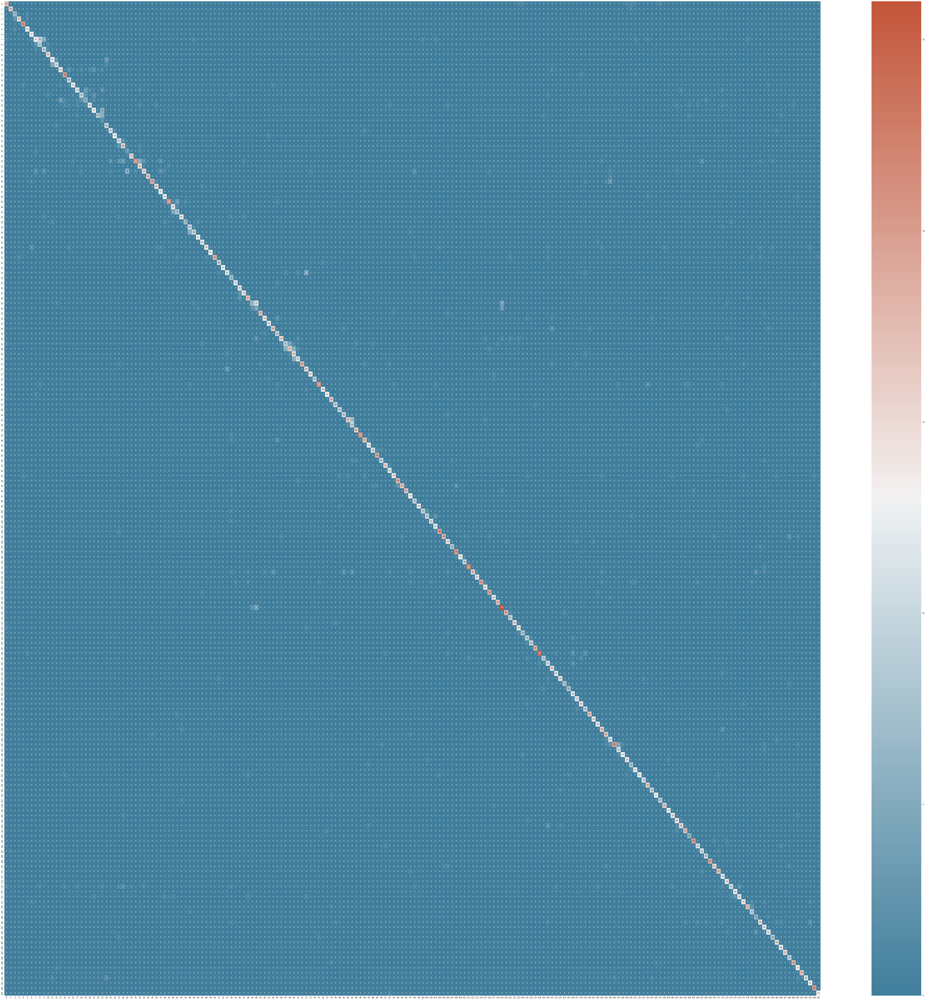

In [190]:
make_confusion_mtrx(model_res_new,val_ds,'conf_mtx.jpg')